# Convolutional Autoencoder

Sticking with the MNIST dataset, let's improve our autoencoder's performance using convolutional layers. Again, loading modules and the data.

In [1]:
%matplotlib inline

import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt
import os 
import matplotlib.pyplot as plt
from matplotlib.image import imread
from scipy.misc import imsave
from scipy.misc import imresize
import numpy as np
from numpy import genfromtxt
import tensorflow as tf
from PIL import Image
import pickle
# from tensorflow_vgg import vgg16|
import collections
import time
import math

# Import GEI dataset 

(128, 88)


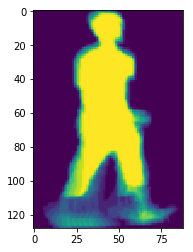

In [6]:
img = imread('{}'.format(os.path.join('./OULP-C1V2_Pack/OULP-GEI-(88x128)-10f/Seq00/0000024', '0000024_55_GEI_10f.png')))
# img = imresize(img, [64, 64], interp='nearest')
print(img.shape)
plt.imshow(img)
plt.show()

In [41]:
# Create Training Data
path = './OULP-C1V2_Pack/OULP-GEI-(88x128)-20f_3/Seq01'
Seq_10f_list = os.listdir(path)
# Seq_10f_list.remove('.DS_Store')

Seq = []
for each_seq in Seq_10f_list:
    seq_path = os.path.join(path, each_seq)
    GEI = []
    for each_GEI in os.listdir(seq_path):
        img = imread('{}'.format(os.path.join(seq_path, each_GEI)))
        img = imresize(img, [64, 64], interp='nearest')
        GEI.append(img)
    Seq.append(np.array(GEI))
Seq = np.array(Seq)
Seq1 = np.ndarray([len(Seq),4,64,64], dtype=float)
for ii, each in enumerate(Seq):
    Seq1[ii] = each

In [42]:
with open('../gait_data/OULP_GEI/GEI64x64_20f_3_Seq01', 'wb') as f:
    np.save(f, Seq1)

# Checkpoint 1

In [2]:
gallery_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq00', mode='rb'))
probe_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq01', mode='rb'))
gallery_10f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_Seq00', mode='rb'))
probe_10f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_Seq01', mode='rb'))

gallery_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq00', mode='rb'))
probe_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq01', mode='rb'))
gallery_10f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_2_Seq00', mode='rb'))
probe_10f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_2_Seq01', mode='rb'))

gallery_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq00', mode='rb'))
probe_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq01', mode='rb'))
gallery_10f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_3_Seq00', mode='rb'))
probe_10f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_3_Seq01', mode='rb'))

In [3]:
gallery_5f = gallery_5f/float(255)
probe_5f = probe_5f/float(255)
gallery_10f = gallery_10f/float(255)
probe_10f = probe_10f/float(255)

gallery_5f_2 = gallery_5f_2/float(255)
probe_5f_2 = probe_5f_2/float(255)
gallery_10f_2 = gallery_10f_2/float(255)
probe_10f_2 = probe_10f_2/float(255)

gallery_5f_3 = gallery_5f_3/float(255)
probe_5f_3 = probe_5f_3/float(255)
gallery_10f_3 = gallery_10f_3/float(255)
probe_10f_3 = probe_10f_3/float(255)

<br><br><br><br><br><br><br><br><br>

In [12]:
# Train X
train_x = np.concatenate([gallery_5f[:2146, 3], probe_5f[:2146, 3], gallery_5f_2[:2146, 3], 
                          probe_5f_2[:2146, 3], gallery_5f_3[:2146, 3], probe_5f_3[:2146, 3]], axis=0)
train_x = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
# Train Y
train_y = np.concatenate([gallery_10f[:2146, 3], probe_10f[:2146, 3], gallery_10f_2[:2146, 3], 
                          probe_10f_2[:2146, 3], gallery_10f_3[:2146, 3], probe_10f_3[:2146, 3]], axis=0)
train_y = np.reshape(train_y, [train_y.shape[0], train_y.shape[1], train_y.shape[2], 1])
print('train_x', train_x.shape, 'train_y', train_y.shape)

# Val X
val_x = np.concatenate([gallery_5f[2146:2646, 3], gallery_5f_2[2146:2646, 3], gallery_5f_3[2146:2646, 3],
                        probe_5f[2146:2646, 3], probe_5f_2[2146:2646, 3], probe_5f_3[2146:2646, 3]], axis=0)
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = np.concatenate([gallery_10f[2146:2646, 3], gallery_10f_2[2146:2646, 3], gallery_10f_3[2146:2646, 3], 
                        probe_10f[2146:2646, 3], probe_10f_2[2146:2646, 3], probe_10f_3[2146:2646, 3]], axis=0)
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = np.concatenate([gallery_5f[2646:, 3], gallery_5f_2[2646:, 3], gallery_5f_3[2646:, 3],
                         probe_5f[2646:, 3], probe_5f_2[2646:, 3], probe_5f_3[2646:, 3]], axis=0)
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = np.concatenate([gallery_10f[2646:, 3], gallery_10f_2[2646:, 3], gallery_10f_3[2646:, 3], 
                         probe_10f[2646:, 3], probe_10f_2[2646:, 3], probe_10f_3[2646:, 3]], axis=0)
test_y = np.reshape(test_y, [test_y.shape[0], test_y.shape[1], test_y.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

train_x (12876, 64, 64, 1) train_y (12876, 64, 64, 1)
val_x (3000, 64, 64, 1) val_y (3000, 64, 64, 1)
test_x (3000, 64, 64, 1) test_y (3000, 64, 64, 1)


# Create Graph

In [13]:
def build_inputs_outputs():
    inputs_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='inputs_1')
    targets_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='targets_1')
    
    return inputs_1, targets_1

def conv_layer(inputs_, weights_name, bias_name, conv_name, pool_name, bn_name, relu_name, add_bacth_norm=True, is_training=True, 
               set_stddev=0.03, out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), pool_size=(2,2), pool_strides=(2,2), 
               keep_prob=0.5):
    ### Encoder
    # e.g. out_dim: 8; kern_size: (3,3); pool_size: (2,2); strides: (2,2);
        
    # filter:[filter_height, filter_width, in_channels, out_channels]
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         inputs_.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name) 
    
    # Set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    # input:[batch, in_height, in_width, in_channels]
    conv2d = tf.nn.bias_add(tf.nn.conv2d(inputs_, weight, stride, padding='SAME', name=conv_name), bias)
    
    # add activation function
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    # add Max pooling
    conv2d = tf.nn.max_pool(conv2d, [1,pool_size[0],pool_size[1],1],\
                                    [1,pool_strides[0],pool_strides[1],1], padding='SAME', name=pool_name)   
    # Now 28x28x
    if add_bacth_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
        
    conv2d_maxpool = tf.layers.dropout(conv2d, rate=keep_prob)
        
    return conv2d_maxpool

#     # Now 14x14x16
#     conv2 = tf.layers.conv2d(maxpool1, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
#     # Now 7x7x8
#     conv3 = tf.layers.conv2d(maxpool2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 7x7x8
#     encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
#     # Now 4x4x8

def deconv_layer(encoded, up_name, weights_name, bias_name, de_conv_name, bn_name, relu_name, add_batch_norm=True, is_training=True, 
                 set_stddev=0.03, up_size=[(2,2),(4,4),(5,5),(6,6)], out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), keep_prob=0.5):
    ### Decoder
    upsample = tf.image.resize_nearest_neighbor(encoded, up_size, name=up_name) # up_size: e.g.(7,7)
    
    # set weight (filter)
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         upsample.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name)
    
    # set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    conv2d = tf.nn.bias_add(tf.nn.conv2d(upsample, weight, stride, padding='SAME', name=de_conv_name),\
                   bias)
    
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    
    conv2d = tf.layers.dropout(conv2d, rate=keep_prob)
    
    return conv2d

#     # Now 7x7x8
#     upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
#     # Now 14x14x8
#     conv5 = tf.layers.conv2d(upsample2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
#     # Now 28x28x8
#     conv6 = tf.layers.conv2d(upsample3, 16, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 28x28x16

def output_layer(conv2d, weights_name, bias_name, logits_name, bn_name, decoded_name, add_batch_norm=True, is_training=True, 
                 set_stddev=0.03, out_dim=1, conv_kernsize=(3,3), conv_strides=(1,1)):
    # set weight (filter)
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         conv2d.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name)
    
    # set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    logits = tf.nn.bias_add(tf.nn.conv2d(conv2d, weight, stride, padding='SAME', name=logits_name),\
                   bias)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    #Now 28x28x1
    decoded = tf.nn.sigmoid(logits, name=decoded_name)
    
    return logits, decoded

In [29]:
def build_graph(kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, 
                de_conv_strides, out_kern_size, out_strides, up_size=[(16,16), (32,32), (64,64)]):
    
    # reset graph
    tf.reset_default_graph()
    
    with tf.name_scope('inputs_targets'):
        inputs_1, targets_1 = build_inputs_outputs()
    
    keep_p = tf.placeholder(tf.float32, name="keep_prob")
    
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    training = tf.placeholder(tf.bool, name='training')
    
    with tf.name_scope('conv_layers'):
        
        maxpool_1 = conv_layer(inputs_1, 'conv_weights_1', 'bias_1', 'conv_1', 'pool_1', 'bn_1', 'relu_1', add_bacth_norm=False, 
                               is_training=training, set_stddev=std, out_dim=64, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_2 = conv_layer(maxpool_1, 'conv_weights_2', 'bias_2', 'conv_2', 'pool_2', 'bn_2', 'relu_2', add_bacth_norm=True, 
                               is_training=training, set_stddev=std, out_dim=32, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_3 = conv_layer(maxpool_2, 'conv_weights_3', 'bias_3', 'conv_3', 'pool_3', 'bn_3', 'relu_3', add_bacth_norm=True, 
                               is_training=training, set_stddev=std, out_dim=16, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
#         maxpool_4 = conv_layer(maxpool_3, 'conv_weights_4', 'bias_4', 'conv_4', 'pool_4', 'bn_4', 'relu_4', add_bacth_norm=True, 
#                                is_training=training, set_stddev=std, out_dim=8, conv_kernsize=kern_size, conv_strides=conv_strides, 
#                                pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        # Now 4x4x8 as hidden layer
        
    with tf.name_scope('deconv_layers'):
        
        deconv_1 = deconv_layer(maxpool_3, 'up_1', 'deconv_weights_1', 'debias_1', 'deconv_1', 'de_bn_1', 'de_relu_1', add_batch_norm=True, 
                              is_training=training, set_stddev=std, up_size=up_size[0], out_dim=16, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_2 = deconv_layer(deconv_1, 'up_2', 'deconv_weights_2', 'debias_2', 'deconv_2', 'de_bn_2', 'de_relu_2', add_batch_norm=True, 
                              is_training=training, set_stddev=std, up_size=up_size[1], out_dim=32, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_3 = deconv_layer(deconv_2, 'up_3', 'deconv_weights_3', 'debias_3', 'deconv_3', 'de_bn_3', 'de_relu_3', add_batch_norm=True, 
                              is_training=training, set_stddev=std, up_size=up_size[2], out_dim=64, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
#         deconv_4 = deconv_layer(deconv_3, 'up_4', 'deconv_weights_4', 'debias_4', 'deconv_4', 'de_bn_4', 'de_relu_4', add_batch_norm=True, 
#                               is_training=training, set_stddev=std, up_size=up_size[3], out_dim=64, conv_kernsize=de_kern_size,
#                               conv_strides=de_conv_strides, keep_prob=keep_p)
        
    with tf.name_scope('output_layer'):
       
        logits, decoded = output_layer(deconv_3, 'output_weights', 'outbias_1', 'logits', 'bn', 'decoded', add_batch_norm=False, is_training=training, 
                                       set_stddev=std, out_dim=1, conv_kernsize=out_kern_size, conv_strides=out_strides)
        
    loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_1, logits=logits, name='loss')
    cost = tf.reduce_mean(loss, name='cost')
#     cost = tf.losses.mean_squared_error(targets_1, decoded)
    opt = tf.train.AdamOptimizer(learning_rate).minimize(cost)
    
    with tf.name_scope('saver'):
        saver = tf.train.Saver()
        
#     merged = tf.summary.merge_all()
    
    export_nodes = ['inputs_1', 'targets_1', 'maxpool_1', 'maxpool_2', 'deconv_1', 'deconv_2', 'training',
                    'logits', 'decoded', 'loss', 'cost', 'opt', 'saver', 'learning_rate', 'keep_p']
    
    Graph = collections.namedtuple('Graph', export_nodes)
    local_dict = locals()
    graph = Graph(*[local_dict[each] for each in export_nodes])
    
    return graph

In [30]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.08)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

In [31]:
def train(model, epochs, save_string):

    with tf.Session(config=tf.ConfigProto(log_device_placement=True)) as sess:
        sess.run(tf.global_variables_initializer())
        
        iteration = 1
        mean_val_loss = 0
        mean_val_acc = 0
        count_loss_not_decrease_epochs = 0
        count_acc_not_decrease_epochs = 0
        Last_val_loss = 0
        Last_val_acc = 0
        
        
        for e in range(epochs):
            for train_batch, target_batch in get_batches(train_x, train_y, batch_size):
                    
                start = time.time()
                
                feed_1 = {
                        model.inputs_1: train_batch, 
                        model.targets_1: target_batch,
                        model.keep_p: 0.5,
                        model.learning_rate: lr,
                        model.training:True
                        }

                train_loss, _, decoded_img = sess.run([model.cost, model.opt, model.decoded], feed_dict=feed_1)
                
                train_acc = cal_accuracy(decoded_img, target_batch)
                
                if iteration%25==0:
                    end = time.time()
#                     acc = calculate_accuracy(sess, pred, target_batch, sq_length)
                    print("Epoch: {}/{},".format(e+1, epochs),' '
                          "Iteration: {},".format(iteration),' '
                          "Train loss: {:.3f},".format(train_loss),'      '
                          "{:.1f}s /batch.".format((end-start)/5),' '
                          "Train Accuracy: %{:.3f}".format(train_acc))

                ##############################################################
                ######################## VALIDATION ##########################
                ##############################################################
                
                if iteration%75==0:
#                     training = True
                    validation_loss = []
                    validation_acc = []
                    
                    if batch_size >= len(val_x):
                        val_batch_size = len(val_x)
                    else: 
                        val_batch_size = batch_size
                        

                    for ii, (val_batch, val_target_batch) in enumerate(get_batches(val_x, val_y, val_batch_size)):
#                         print(ii, len(val_x)//val_batch_size)
                        feed_2 = {
                                model.inputs_1: val_batch,
                                model.targets_1: val_target_batch,
                                model.keep_p: 1,
                                model.training:True
                                }
                        
                        val_loss, val_decoded_img = sess.run([model.cost, model.decoded], 
                                                                          feed_dict=feed_2)

                        val_acc = cal_accuracy(val_decoded_img, val_target_batch)
                        
                        validation_loss.append(val_loss)
                        validation_acc.append(val_acc)
                    
                    Last_val_loss = mean_val_loss
                    Last_val_acc = mean_val_acc
                    mean_val_loss = np.mean(np.array(validation_loss))
                    mean_val_acc = np.mean(np.array(validation_acc))
                    
                    print()
                    print("Validation loss: {:.3f},".format(mean_val_loss),' '
                          "Validation accuracy: {:.3f},".format(mean_val_acc))
#                           "maxpool_3.shape: {}.".format(max_pool_3[0].shape))
                    print()
                ####### plot #######
                if iteration%500==0:
                    
                    feed_3 = {
                            model.inputs_1: val_x[:10],
                            model.keep_p: 1,
                            model.training:True
                            }
                    
                    fig, axes = plt.subplots(nrows=3, ncols=10, sharex=True, sharey=True, figsize=(20,4))
                    in_imgs = val_x[:10]
                    target_imgs = val_y[:10]
                    reconstructed = sess.run(model.decoded, feed_dict=feed_3)

                    # plot out
                    for images, row in zip([in_imgs, target_imgs, reconstructed], axes):
                        for img, ax in zip(images, row):
                            ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
                            ax.get_xaxis().set_visible(False)
                            ax.get_yaxis().set_visible(False)


                    fig.tight_layout(pad=0.1)
                            
                    
                    
                    
                    
                iteration += 1
                
#             # Early stopping  
#             if mean_val_Acc - Last_val_Acc <= -0.3:
#                 count_Acc_not_increase_epochs += 1
#             if Last_val_loss - mean_val_loss <= -0.01:
#                 count_loss_not_decrease_epochs += 1
                
#             if mean_val_Acc - Last_val_Acc <= -2:
#                 break
#             if count_Acc_not_increase_epochs >= 10:
#                 break
#             if count_loss_not_decrease_epochs >= 10:
#                 break
                
        model.saver.save(sess, r"{}".format(save_string))

mkdir: cannot create directory ‘checkpoints_view_invariant’: File exists
Epoch: 1/3000,  Iteration: 25,  Train loss: 0.279,       0.0s /batch.  Train Accuracy: %54.240
Epoch: 1/3000,  Iteration: 50,  Train loss: 0.233,       0.0s /batch.  Train Accuracy: %72.290
Epoch: 1/3000,  Iteration: 75,  Train loss: 0.211,       0.0s /batch.  Train Accuracy: %77.195

Validation loss: 0.218,  Validation accuracy: 76.171,

Epoch: 1/3000,  Iteration: 100,  Train loss: 0.201,       0.0s /batch.  Train Accuracy: %78.297
Epoch: 1/3000,  Iteration: 125,  Train loss: 0.192,       0.0s /batch.  Train Accuracy: %79.972
Epoch: 1/3000,  Iteration: 150,  Train loss: 0.197,       0.0s /batch.  Train Accuracy: %78.373

Validation loss: 0.203,  Validation accuracy: 78.350,

Epoch: 2/3000,  Iteration: 175,  Train loss: 0.200,       0.0s /batch.  Train Accuracy: %77.521
Epoch: 2/3000,  Iteration: 200,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %79.596
Epoch: 2/3000,  Iteration: 225,  Train loss: 0.187

Epoch: 12/3000,  Iteration: 1800,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %83.787

Validation loss: 0.187,  Validation accuracy: 81.912,

Epoch: 12/3000,  Iteration: 1825,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.385
Epoch: 12/3000,  Iteration: 1850,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %85.576
Epoch: 12/3000,  Iteration: 1875,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %85.922

Validation loss: 0.188,  Validation accuracy: 82.547,

Epoch: 12/3000,  Iteration: 1900,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.669
Epoch: 13/3000,  Iteration: 1925,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %78.306
Epoch: 13/3000,  Iteration: 1950,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %83.725

Validation loss: 0.186,  Validation accuracy: 82.330,

Epoch: 13/3000,  Iteration: 1975,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %84.392
Epoch: 13/3000,  Iteration: 2000,  Train loss: 0

Epoch: 23/3000,  Iteration: 3550,  Train loss: 0.178,       0.0s /batch.  Train Accuracy: %85.113
Epoch: 23/3000,  Iteration: 3575,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %85.559
Epoch: 23/3000,  Iteration: 3600,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %86.269

Validation loss: 0.182,  Validation accuracy: 84.121,

Epoch: 23/3000,  Iteration: 3625,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %86.502
Epoch: 23/3000,  Iteration: 3650,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %86.670
Epoch: 23/3000,  Iteration: 3675,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %75.222

Validation loss: 0.184,  Validation accuracy: 82.339,

Epoch: 24/3000,  Iteration: 3700,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %83.785
Epoch: 24/3000,  Iteration: 3725,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %85.046
Epoch: 24/3000,  Iteration: 3750,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %86.134

Valid

Epoch: 34/3000,  Iteration: 5325,  Train loss: 0.180,       0.0s /batch.  Train Accuracy: %85.798

Validation loss: 0.182,  Validation accuracy: 84.379,

Epoch: 34/3000,  Iteration: 5350,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %86.895
Epoch: 34/3000,  Iteration: 5375,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %87.899
Epoch: 34/3000,  Iteration: 5400,  Train loss: 0.161,       0.0s /batch.  Train Accuracy: %88.015

Validation loss: 0.184,  Validation accuracy: 84.013,

Epoch: 34/3000,  Iteration: 5425,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %86.355
Epoch: 35/3000,  Iteration: 5450,  Train loss: 0.180,       0.0s /batch.  Train Accuracy: %81.772
Epoch: 35/3000,  Iteration: 5475,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %86.029

Validation loss: 0.182,  Validation accuracy: 83.667,

Epoch: 35/3000,  Iteration: 5500,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %86.949
Epoch: 35/3000,  Iteration: 5525,  Train loss: 0

Epoch: 45/3000,  Iteration: 7075,  Train loss: 0.178,       0.0s /batch.  Train Accuracy: %86.514
Epoch: 45/3000,  Iteration: 7100,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %87.320
Epoch: 45/3000,  Iteration: 7125,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %87.444

Validation loss: 0.183,  Validation accuracy: 84.629,

Epoch: 45/3000,  Iteration: 7150,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %87.168
Epoch: 45/3000,  Iteration: 7175,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %87.577
Epoch: 45/3000,  Iteration: 7200,  Train loss: 0.206,       0.0s /batch.  Train Accuracy: %74.582

Validation loss: 0.189,  Validation accuracy: 78.128,

Epoch: 46/3000,  Iteration: 7225,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %85.394
Epoch: 46/3000,  Iteration: 7250,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %86.722
Epoch: 46/3000,  Iteration: 7275,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %87.911

Valid

Epoch: 56/3000,  Iteration: 8850,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %87.162

Validation loss: 0.181,  Validation accuracy: 85.188,

Epoch: 56/3000,  Iteration: 8875,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %88.193
Epoch: 56/3000,  Iteration: 8900,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %87.797
Epoch: 56/3000,  Iteration: 8925,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %87.919

Validation loss: 0.182,  Validation accuracy: 85.207,

Epoch: 56/3000,  Iteration: 8950,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %87.985
Epoch: 57/3000,  Iteration: 8975,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %84.171
Epoch: 57/3000,  Iteration: 9000,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %87.690

Validation loss: 0.181,  Validation accuracy: 84.707,

Epoch: 57/3000,  Iteration: 9025,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %87.886
Epoch: 57/3000,  Iteration: 9050,  Train loss: 0

/usr/home/rez/anaconda3/envs/tensorflow/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch: 66/3000,  Iteration: 10525,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %88.102
Epoch: 66/3000,  Iteration: 10550,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %88.269
Epoch: 67/3000,  Iteration: 10575,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %84.592

Validation loss: 0.183,  Validation accuracy: 81.910,

Epoch: 67/3000,  Iteration: 10600,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %87.904
Epoch: 67/3000,  Iteration: 10625,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.139
Epoch: 67/3000,  Iteration: 10650,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.319

Validation loss: 0.181,  Validation accuracy: 85.024,

Epoch: 67/3000,  Iteration: 10675,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.925
Epoch: 67/3000,  Iteration: 10700,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %88.450
Epoch: 68/3000,  Iteration: 10725,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %81.3

Epoch: 77/3000,  Iteration: 12275,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.169
Epoch: 77/3000,  Iteration: 12300,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %88.628

Validation loss: 0.181,  Validation accuracy: 85.344,

Epoch: 78/3000,  Iteration: 12325,  Train loss: 0.180,       0.0s /batch.  Train Accuracy: %81.570
Epoch: 78/3000,  Iteration: 12350,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %87.431
Epoch: 78/3000,  Iteration: 12375,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %87.794

Validation loss: 0.181,  Validation accuracy: 85.251,

Epoch: 78/3000,  Iteration: 12400,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.362
Epoch: 78/3000,  Iteration: 12425,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.154
Epoch: 78/3000,  Iteration: 12450,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.616

Validation loss: 0.181,  Validation accuracy: 85.748,

Epoch: 78/3000,  Iteration: 12475,  Trai

Epoch: 88/3000,  Iteration: 14025,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.429

Validation loss: 0.181,  Validation accuracy: 85.594,

Epoch: 88/3000,  Iteration: 14050,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.718
Epoch: 88/3000,  Iteration: 14075,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %75.597
Epoch: 89/3000,  Iteration: 14100,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %85.506

Validation loss: 0.181,  Validation accuracy: 83.618,

Epoch: 89/3000,  Iteration: 14125,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %87.142
Epoch: 89/3000,  Iteration: 14150,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %88.199
Epoch: 89/3000,  Iteration: 14175,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.124

Validation loss: 0.180,  Validation accuracy: 85.597,

Epoch: 89/3000,  Iteration: 14200,  Train loss: 0.158,       0.0s /batch.  Train Accuracy: %89.866
Epoch: 89/3000,  Iteration: 14225,  Trai


Validation loss: 0.181,  Validation accuracy: 85.204,

Epoch: 99/3000,  Iteration: 15775,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %88.665
Epoch: 99/3000,  Iteration: 15800,  Train loss: 0.158,       0.0s /batch.  Train Accuracy: %89.759
Epoch: 99/3000,  Iteration: 15825,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %87.647

Validation loss: 0.181,  Validation accuracy: 85.561,

Epoch: 100/3000,  Iteration: 15850,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %83.991
Epoch: 100/3000,  Iteration: 15875,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %87.547
Epoch: 100/3000,  Iteration: 15900,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %88.128

Validation loss: 0.182,  Validation accuracy: 85.181,

Epoch: 100/3000,  Iteration: 15925,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.499
Epoch: 100/3000,  Iteration: 15950,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %88.244
Epoch: 100/3000,  Iteration: 15975,

Epoch: 110/3000,  Iteration: 17500,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %88.321
Epoch: 110/3000,  Iteration: 17525,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.624
Epoch: 110/3000,  Iteration: 17550,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %88.605

Validation loss: 0.180,  Validation accuracy: 85.948,

Epoch: 110/3000,  Iteration: 17575,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %88.997
Epoch: 110/3000,  Iteration: 17600,  Train loss: 0.205,       0.0s /batch.  Train Accuracy: %74.955
Epoch: 111/3000,  Iteration: 17625,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %86.796

Validation loss: 0.180,  Validation accuracy: 84.782,

Epoch: 111/3000,  Iteration: 17650,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %87.982
Epoch: 111/3000,  Iteration: 17675,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.939
Epoch: 111/3000,  Iteration: 17700,  Train loss: 0.165,       0.0s /batch.  Train Accura

Epoch: 121/3000,  Iteration: 19250,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %88.045
Epoch: 121/3000,  Iteration: 19275,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.969

Validation loss: 0.180,  Validation accuracy: 85.977,

Epoch: 121/3000,  Iteration: 19300,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %88.464
Epoch: 121/3000,  Iteration: 19325,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.029
Epoch: 121/3000,  Iteration: 19350,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %88.503

Validation loss: 0.180,  Validation accuracy: 85.718,

Epoch: 122/3000,  Iteration: 19375,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %85.752
Epoch: 122/3000,  Iteration: 19400,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.114
Epoch: 122/3000,  Iteration: 19425,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.979

Validation loss: 0.180,  Validation accuracy: 85.469,

Epoch: 122/3000,  Iteration: 194

Epoch: 132/3000,  Iteration: 21000,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.213

Validation loss: 0.180,  Validation accuracy: 85.109,

Epoch: 132/3000,  Iteration: 21025,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.023
Epoch: 132/3000,  Iteration: 21050,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.133
Epoch: 132/3000,  Iteration: 21075,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %89.756

Validation loss: 0.182,  Validation accuracy: 85.246,

Epoch: 132/3000,  Iteration: 21100,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.223
Epoch: 133/3000,  Iteration: 21125,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %82.321
Epoch: 133/3000,  Iteration: 21150,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %87.864

Validation loss: 0.181,  Validation accuracy: 85.141,

Epoch: 133/3000,  Iteration: 21175,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.526
Epoch: 133/3000,  Iteration: 212


Validation loss: 0.187,  Validation accuracy: 80.260,

Epoch: 143/3000,  Iteration: 22750,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %87.967
Epoch: 143/3000,  Iteration: 22775,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.543
Epoch: 143/3000,  Iteration: 22800,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.972

Validation loss: 0.180,  Validation accuracy: 85.978,

Epoch: 143/3000,  Iteration: 22825,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %88.992
Epoch: 143/3000,  Iteration: 22850,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.027
Epoch: 143/3000,  Iteration: 22875,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %76.089

Validation loss: 0.180,  Validation accuracy: 84.774,

Epoch: 144/3000,  Iteration: 22900,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %86.216
Epoch: 144/3000,  Iteration: 22925,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %87.604
Epoch: 144/3000,  Iteration: 229

Epoch: 153/3000,  Iteration: 24475,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %76.073
Epoch: 154/3000,  Iteration: 24500,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %86.664
Epoch: 154/3000,  Iteration: 24525,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %87.452

Validation loss: 0.180,  Validation accuracy: 85.767,

Epoch: 154/3000,  Iteration: 24550,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.083
Epoch: 154/3000,  Iteration: 24575,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.158
Epoch: 154/3000,  Iteration: 24600,  Train loss: 0.158,       0.0s /batch.  Train Accuracy: %90.004

Validation loss: 0.181,  Validation accuracy: 85.633,

Epoch: 154/3000,  Iteration: 24625,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %87.969
Epoch: 155/3000,  Iteration: 24650,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %84.447
Epoch: 155/3000,  Iteration: 24675,  Train loss: 0.176,       0.0s /batch.  Train Accura

Epoch: 164/3000,  Iteration: 26225,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.466
Epoch: 165/3000,  Iteration: 26250,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %84.814

Validation loss: 0.183,  Validation accuracy: 81.859,

Epoch: 165/3000,  Iteration: 26275,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %88.066
Epoch: 165/3000,  Iteration: 26300,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %88.684
Epoch: 165/3000,  Iteration: 26325,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %88.926

Validation loss: 0.181,  Validation accuracy: 85.631,

Epoch: 165/3000,  Iteration: 26350,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %88.633
Epoch: 165/3000,  Iteration: 26375,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %88.825
Epoch: 165/3000,  Iteration: 26400,  Train loss: 0.206,       0.0s /batch.  Train Accuracy: %75.377

Validation loss: 0.185,  Validation accuracy: 80.380,

Epoch: 166/3000,  Iteration: 264

Epoch: 175/3000,  Iteration: 27975,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %89.093

Validation loss: 0.180,  Validation accuracy: 86.177,

Epoch: 175/3000,  Iteration: 28000,  Train loss: 0.205,       0.0s /batch.  Train Accuracy: %75.444
Epoch: 176/3000,  Iteration: 28025,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %87.228
Epoch: 176/3000,  Iteration: 28050,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %88.095

Validation loss: 0.180,  Validation accuracy: 85.857,

Epoch: 176/3000,  Iteration: 28075,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.227
Epoch: 176/3000,  Iteration: 28100,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %88.901
Epoch: 176/3000,  Iteration: 28125,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.085

Validation loss: 0.180,  Validation accuracy: 86.004,

Epoch: 176/3000,  Iteration: 28150,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.341
Epoch: 177/3000,  Iteration: 281


Validation loss: 0.180,  Validation accuracy: 86.157,

Epoch: 186/3000,  Iteration: 29725,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.150
Epoch: 186/3000,  Iteration: 29750,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.310
Epoch: 187/3000,  Iteration: 29775,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %86.388

Validation loss: 0.182,  Validation accuracy: 83.090,

Epoch: 187/3000,  Iteration: 29800,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.396
Epoch: 187/3000,  Iteration: 29825,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.113
Epoch: 187/3000,  Iteration: 29850,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.519

Validation loss: 0.181,  Validation accuracy: 85.442,

Epoch: 187/3000,  Iteration: 29875,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %89.904
Epoch: 187/3000,  Iteration: 29900,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.593
Epoch: 188/3000,  Iteration: 299

Epoch: 197/3000,  Iteration: 31450,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.509
Epoch: 197/3000,  Iteration: 31475,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %89.942
Epoch: 197/3000,  Iteration: 31500,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.651

Validation loss: 0.181,  Validation accuracy: 85.689,

Epoch: 198/3000,  Iteration: 31525,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %83.559
Epoch: 198/3000,  Iteration: 31550,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.048
Epoch: 198/3000,  Iteration: 31575,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %88.894

Validation loss: 0.180,  Validation accuracy: 85.929,

Epoch: 198/3000,  Iteration: 31600,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.098
Epoch: 198/3000,  Iteration: 31625,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.323
Epoch: 198/3000,  Iteration: 31650,  Train loss: 0.166,       0.0s /batch.  Train Accura

Epoch: 208/3000,  Iteration: 33200,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.180
Epoch: 208/3000,  Iteration: 33225,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.338

Validation loss: 0.180,  Validation accuracy: 86.297,

Epoch: 208/3000,  Iteration: 33250,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.278
Epoch: 208/3000,  Iteration: 33275,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %76.211
Epoch: 209/3000,  Iteration: 33300,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %87.132

Validation loss: 0.180,  Validation accuracy: 84.662,

Epoch: 209/3000,  Iteration: 33325,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %87.552
Epoch: 209/3000,  Iteration: 33350,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.196
Epoch: 209/3000,  Iteration: 33375,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.648

Validation loss: 0.180,  Validation accuracy: 85.783,

Epoch: 209/3000,  Iteration: 334

Epoch: 219/3000,  Iteration: 34950,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.326

Validation loss: 0.180,  Validation accuracy: 85.760,

Epoch: 219/3000,  Iteration: 34975,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.865
Epoch: 219/3000,  Iteration: 35000,  Train loss: 0.157,       0.0s /batch.  Train Accuracy: %90.327
Epoch: 219/3000,  Iteration: 35025,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.665

Validation loss: 0.181,  Validation accuracy: 85.592,

Epoch: 220/3000,  Iteration: 35050,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %85.122
Epoch: 220/3000,  Iteration: 35075,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %88.595
Epoch: 220/3000,  Iteration: 35100,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.084

Validation loss: 0.182,  Validation accuracy: 85.180,

Epoch: 220/3000,  Iteration: 35125,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.103
Epoch: 220/3000,  Iteration: 351


Validation loss: 0.181,  Validation accuracy: 85.091,

Epoch: 230/3000,  Iteration: 36700,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.120
Epoch: 230/3000,  Iteration: 36725,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.289
Epoch: 230/3000,  Iteration: 36750,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %88.904

Validation loss: 0.180,  Validation accuracy: 86.174,

Epoch: 230/3000,  Iteration: 36775,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.438
Epoch: 230/3000,  Iteration: 36800,  Train loss: 0.204,       0.0s /batch.  Train Accuracy: %75.781
Epoch: 231/3000,  Iteration: 36825,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %87.616

Validation loss: 0.180,  Validation accuracy: 85.174,

Epoch: 231/3000,  Iteration: 36850,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %88.334
Epoch: 231/3000,  Iteration: 36875,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.365
Epoch: 231/3000,  Iteration: 369

Epoch: 241/3000,  Iteration: 38425,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %87.493
Epoch: 241/3000,  Iteration: 38450,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %88.327
Epoch: 241/3000,  Iteration: 38475,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.288

Validation loss: 0.180,  Validation accuracy: 86.072,

Epoch: 241/3000,  Iteration: 38500,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %88.852
Epoch: 241/3000,  Iteration: 38525,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.261
Epoch: 241/3000,  Iteration: 38550,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.172

Validation loss: 0.180,  Validation accuracy: 85.940,

Epoch: 242/3000,  Iteration: 38575,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %86.749
Epoch: 242/3000,  Iteration: 38600,  Train loss: 0.161,       0.0s /batch.  Train Accuracy: %89.415
Epoch: 242/3000,  Iteration: 38625,  Train loss: 0.165,       0.0s /batch.  Train Accura

Epoch: 252/3000,  Iteration: 40175,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %87.075
Epoch: 252/3000,  Iteration: 40200,  Train loss: 0.161,       0.0s /batch.  Train Accuracy: %89.548

Validation loss: 0.180,  Validation accuracy: 85.297,

Epoch: 252/3000,  Iteration: 40225,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.181
Epoch: 252/3000,  Iteration: 40250,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.305
Epoch: 252/3000,  Iteration: 40275,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.215

Validation loss: 0.183,  Validation accuracy: 85.486,

Epoch: 252/3000,  Iteration: 40300,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.795
Epoch: 253/3000,  Iteration: 40325,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %84.152
Epoch: 253/3000,  Iteration: 40350,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.336

Validation loss: 0.180,  Validation accuracy: 85.396,

Epoch: 253/3000,  Iteration: 403

Epoch: 263/3000,  Iteration: 41925,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %84.137

Validation loss: 0.183,  Validation accuracy: 81.444,

Epoch: 263/3000,  Iteration: 41950,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.465
Epoch: 263/3000,  Iteration: 41975,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.127
Epoch: 263/3000,  Iteration: 42000,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.340

Validation loss: 0.180,  Validation accuracy: 86.200,

Epoch: 263/3000,  Iteration: 42025,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.307
Epoch: 263/3000,  Iteration: 42050,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.362
Epoch: 263/3000,  Iteration: 42075,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %76.273

Validation loss: 0.179,  Validation accuracy: 85.834,

Epoch: 264/3000,  Iteration: 42100,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %87.532
Epoch: 264/3000,  Iteration: 421


Validation loss: 0.180,  Validation accuracy: 86.265,

Epoch: 273/3000,  Iteration: 43675,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %76.341
Epoch: 274/3000,  Iteration: 43700,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %87.681
Epoch: 274/3000,  Iteration: 43725,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %87.897

Validation loss: 0.180,  Validation accuracy: 85.680,

Epoch: 274/3000,  Iteration: 43750,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.012
Epoch: 274/3000,  Iteration: 43775,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.508
Epoch: 274/3000,  Iteration: 43800,  Train loss: 0.157,       0.0s /batch.  Train Accuracy: %90.312

Validation loss: 0.181,  Validation accuracy: 85.635,

Epoch: 274/3000,  Iteration: 43825,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.831
Epoch: 275/3000,  Iteration: 43850,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.557
Epoch: 275/3000,  Iteration: 438

Epoch: 284/3000,  Iteration: 45400,  Train loss: 0.157,       0.0s /batch.  Train Accuracy: %90.361
Epoch: 284/3000,  Iteration: 45425,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.890
Epoch: 285/3000,  Iteration: 45450,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.634

Validation loss: 0.184,  Validation accuracy: 82.078,

Epoch: 285/3000,  Iteration: 45475,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %88.564
Epoch: 285/3000,  Iteration: 45500,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.449
Epoch: 285/3000,  Iteration: 45525,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.371

Validation loss: 0.181,  Validation accuracy: 85.878,

Epoch: 285/3000,  Iteration: 45550,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.029
Epoch: 285/3000,  Iteration: 45575,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.614
Epoch: 285/3000,  Iteration: 45600,  Train loss: 0.204,       0.0s /batch.  Train Accura

Epoch: 295/3000,  Iteration: 47150,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.062
Epoch: 295/3000,  Iteration: 47175,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.661

Validation loss: 0.180,  Validation accuracy: 86.300,

Epoch: 295/3000,  Iteration: 47200,  Train loss: 0.203,       0.0s /batch.  Train Accuracy: %75.890
Epoch: 296/3000,  Iteration: 47225,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %87.924
Epoch: 296/3000,  Iteration: 47250,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %88.610

Validation loss: 0.179,  Validation accuracy: 85.979,

Epoch: 296/3000,  Iteration: 47275,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.443
Epoch: 296/3000,  Iteration: 47300,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %89.210
Epoch: 296/3000,  Iteration: 47325,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.226

Validation loss: 0.181,  Validation accuracy: 86.156,

Epoch: 296/3000,  Iteration: 473

Epoch: 306/3000,  Iteration: 48900,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %89.219

Validation loss: 0.180,  Validation accuracy: 86.218,

Epoch: 306/3000,  Iteration: 48925,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.255
Epoch: 306/3000,  Iteration: 48950,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.433
Epoch: 307/3000,  Iteration: 48975,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %87.117

Validation loss: 0.181,  Validation accuracy: 83.245,

Epoch: 307/3000,  Iteration: 49000,  Train loss: 0.161,       0.0s /batch.  Train Accuracy: %89.657
Epoch: 307/3000,  Iteration: 49025,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.506
Epoch: 307/3000,  Iteration: 49050,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.598

Validation loss: 0.182,  Validation accuracy: 85.449,

Epoch: 307/3000,  Iteration: 49075,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.296
Epoch: 307/3000,  Iteration: 491


Validation loss: 0.181,  Validation accuracy: 85.485,

Epoch: 317/3000,  Iteration: 50650,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.619
Epoch: 317/3000,  Iteration: 50675,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.318
Epoch: 317/3000,  Iteration: 50700,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.971

Validation loss: 0.181,  Validation accuracy: 85.841,

Epoch: 318/3000,  Iteration: 50725,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %84.656
Epoch: 318/3000,  Iteration: 50750,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.596
Epoch: 318/3000,  Iteration: 50775,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.419

Validation loss: 0.180,  Validation accuracy: 86.126,

Epoch: 318/3000,  Iteration: 50800,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.445
Epoch: 318/3000,  Iteration: 50825,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.500
Epoch: 318/3000,  Iteration: 508

Epoch: 328/3000,  Iteration: 52375,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.457
Epoch: 328/3000,  Iteration: 52400,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.488
Epoch: 328/3000,  Iteration: 52425,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.544

Validation loss: 0.180,  Validation accuracy: 86.387,

Epoch: 328/3000,  Iteration: 52450,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.490
Epoch: 328/3000,  Iteration: 52475,  Train loss: 0.211,       0.0s /batch.  Train Accuracy: %76.585
Epoch: 329/3000,  Iteration: 52500,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %87.718

Validation loss: 0.180,  Validation accuracy: 84.772,

Epoch: 329/3000,  Iteration: 52525,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %88.149
Epoch: 329/3000,  Iteration: 52550,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.229
Epoch: 329/3000,  Iteration: 52575,  Train loss: 0.167,       0.0s /batch.  Train Accura

Epoch: 339/3000,  Iteration: 54125,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %88.028
Epoch: 339/3000,  Iteration: 54150,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.284

Validation loss: 0.180,  Validation accuracy: 85.819,

Epoch: 339/3000,  Iteration: 54175,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.112
Epoch: 339/3000,  Iteration: 54200,  Train loss: 0.157,       0.0s /batch.  Train Accuracy: %90.277
Epoch: 339/3000,  Iteration: 54225,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.956

Validation loss: 0.181,  Validation accuracy: 85.767,

Epoch: 340/3000,  Iteration: 54250,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.558
Epoch: 340/3000,  Iteration: 54275,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %88.292
Epoch: 340/3000,  Iteration: 54300,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.545

Validation loss: 0.181,  Validation accuracy: 85.317,

Epoch: 340/3000,  Iteration: 543

Epoch: 350/3000,  Iteration: 55875,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %88.787

Validation loss: 0.181,  Validation accuracy: 85.149,

Epoch: 350/3000,  Iteration: 55900,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.548
Epoch: 350/3000,  Iteration: 55925,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.459
Epoch: 350/3000,  Iteration: 55950,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.290

Validation loss: 0.180,  Validation accuracy: 86.303,

Epoch: 350/3000,  Iteration: 55975,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.691
Epoch: 350/3000,  Iteration: 56000,  Train loss: 0.202,       0.0s /batch.  Train Accuracy: %76.230
Epoch: 351/3000,  Iteration: 56025,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.282

Validation loss: 0.181,  Validation accuracy: 85.366,



KeyboardInterrupt: 

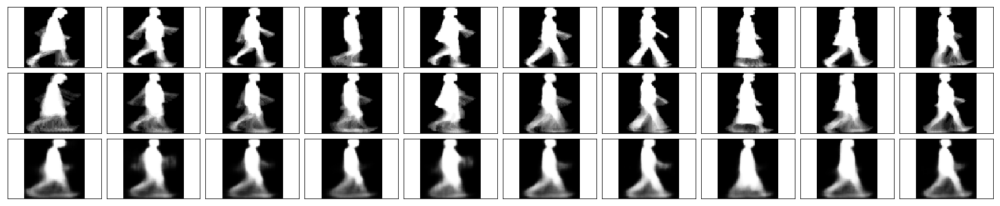

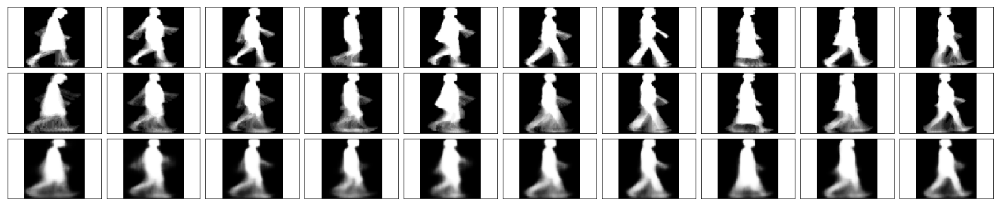

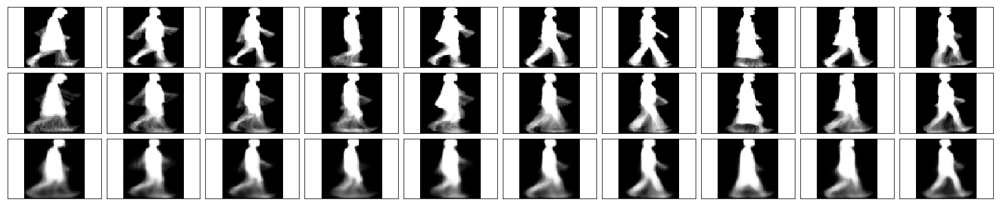

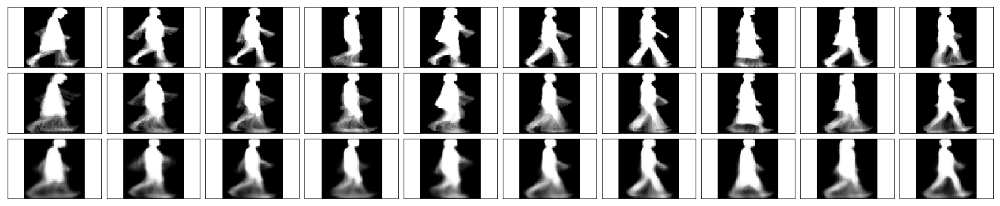

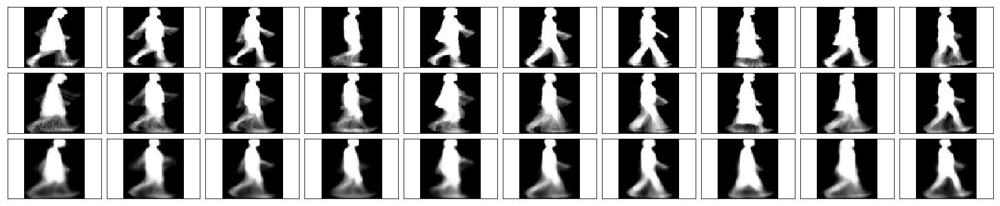

...

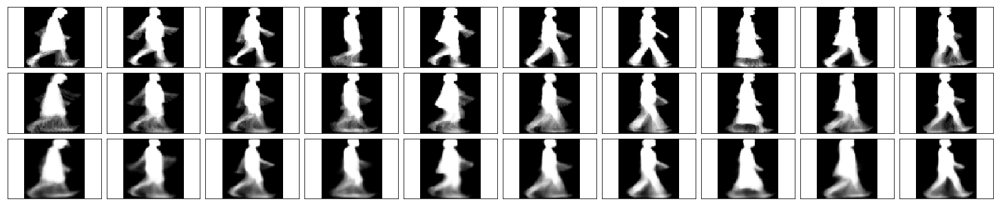

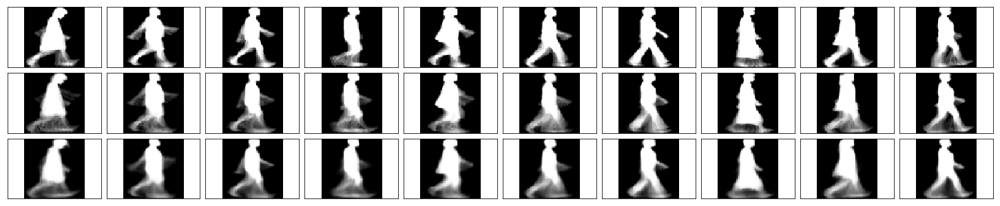

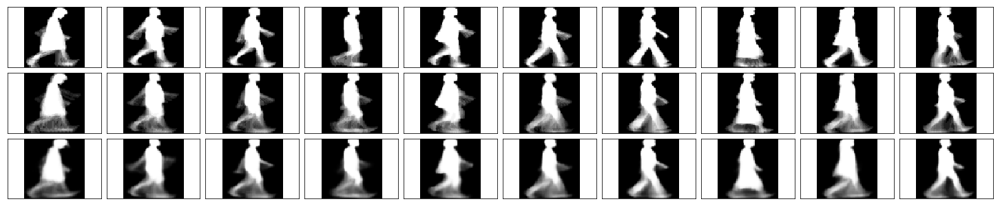

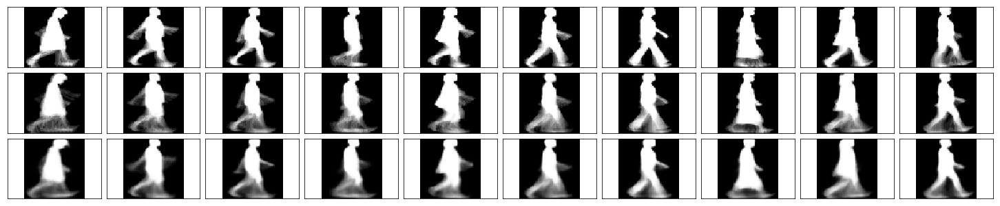

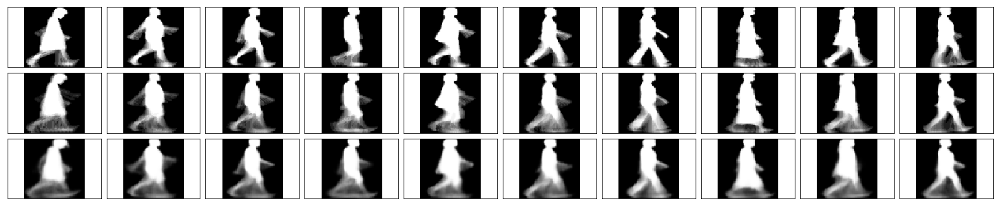

In [28]:
!mkdir checkpoints_view_invariant

epochs = 3000
num_layers = 3
batch_size = 80
conv_kern_size = (4,4) #
conv_strides = (1,1) ##
pool_size = (2,2)
pool_strides = (2,2)
# up_size = [(8,8), (16,16), (32,32), (64,64)]
up_size = [(16,16), (32,32), (64,64)]
# up_size = [(32,32), (64,64)]
de_kern_size = (4,4) #
de_conv_strides = (1,1) ##
out_kern_size = (4,4) #
out_strides = (1,1)
std = 0.03

for lr in [0.0004]:
#                 log_string = 'logs/4/lr={},nl={},ls={},bs={}'.format(lr, num_layers, lstm_size, batch_size)
    save_string = './checkpoints_view_invariant/5to10_add-more-data_lr={}_nl={}_bs={}.ckpt'.format(lr, num_layers, batch_size)
                
#             writer = tf.summary.FileWriter(log_string)
#     build_graph(kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, 
#                 de_conv_strides, out_kern_size, out_strides, up_size=[(16,16), (32,32), (64,64)], set_is_training=True):
    
    model = build_graph(conv_kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, de_conv_strides,
                        out_kern_size, out_strides, up_size=up_size)

    train(model, epochs, save_string)
                
    print(' ')
    print(' ')
    print("leraning_rate={},num_layers={},batch_size={} finished, saved".format(lr, num_layers, batch_size))
    print(' ')
    print(' ')

<br><br><br><br><br><br><br><br><br>

## Network Architecture

The encoder part of the network will be a typical convolutional pyramid. Each convolutional layer will be followed by a max-pooling layer to reduce the dimensions of the layers. The decoder though might be something new to you. The decoder needs to convert from a narrow representation to a wide reconstructed image. For example, the representation could be a 4x4x8 max-pool layer. This is the output of the encoder, but also the input to the decoder. We want to get a 28x28x1 image out from the decoder so we need to work our way back up from the narrow decoder input layer. A schematic of the network is shown below.

<img src='assets/convolutional_autoencoder.png' width=500px>

Here our final encoder layer has size 4x4x8 = 128. The original images have size 28x28 = 784, so the encoded vector is roughly 16% the size of the original image. These are just suggested sizes for each of the layers. Feel free to change the depths and sizes, but remember our goal here is to find a small representation of the input data.

### What's going on with the decoder

Okay, so the decoder has these "Upsample" layers that you might not have seen before. First off, I'll discuss a bit what these layers *aren't*. Usually, you'll see **transposed convolution** layers used to increase the width and height of the layers. They work almost exactly the same as convolutional layers, but in reverse. A stride in the input layer results in a larger stride in the transposed convolution layer. For example, if you have a 3x3 kernel, a 3x3 patch in the input layer will be reduced to one unit in a convolutional layer. Comparatively, one unit in the input layer will be expanded to a 3x3 path in a transposed convolution layer. The TensorFlow API provides us with an easy way to create the layers, [`tf.nn.conv2d_transpose`](https://www.tensorflow.org/api_docs/python/tf/nn/conv2d_transpose). 

However, transposed convolution layers can lead to artifacts in the final images, such as checkerboard patterns. This is due to overlap in the kernels which can be avoided by setting the stride and kernel size equal. In [this Distill article](http://distill.pub/2016/deconv-checkerboard/) from Augustus Odena, *et al*, the authors show that these checkerboard artifacts can be avoided by resizing the layers using nearest neighbor or bilinear interpolation (upsampling) followed by a convolutional layer. In TensorFlow, this is easily done with [`tf.image.resize_images`](https://www.tensorflow.org/versions/r1.1/api_docs/python/tf/image/resize_images), followed by a convolution. Be sure to read the Distill article to get a better understanding of deconvolutional layers and why we're using upsampling.

> **Exercise:** Build the network shown above. Remember that a convolutional layer with strides of 1 and 'same' padding won't reduce the height and width. That is, if the input is 28x28 and the convolution layer has stride = 1 and 'same' padding, the convolutional layer will also be 28x28. The max-pool layers are used the reduce the width and height. A stride of 2 will reduce the size by 2. Odena *et al* claim that nearest neighbor interpolation works best for the upsampling, so make sure to include that as a parameter in `tf.image.resize_images` or use [`tf.image.resize_nearest_neighbor`]( `https://www.tensorflow.org/api_docs/python/tf/image/resize_nearest_neighbor). For convolutional layers, use [`tf.layers.conv2d`](https://www.tensorflow.org/api_docs/python/tf/layers/conv2d). For example, you would write `conv1 = tf.layers.conv2d(inputs, 32, (5,5), padding='same', activation=tf.nn.relu)` for a layer with a depth of 32, a 5x5 kernel, stride of (1,1), padding is 'same', and a ReLU activation. Similarly, for the max-pool layers, use [`tf.layers.max_pooling2d`](https://www.tensorflow.org/api_docs/python/tf/layers/max_pooling2d).

## Training

As before, here wi'll train the network. Instead of flattening the images though, we can pass them in as 28x28x1 arrays.

In [6]:
sess = tf.Session()

In [ ]:
epochs = 20
batch_size = 200
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        imgs = batch[0].reshape((-1, 28, 28, 1))
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

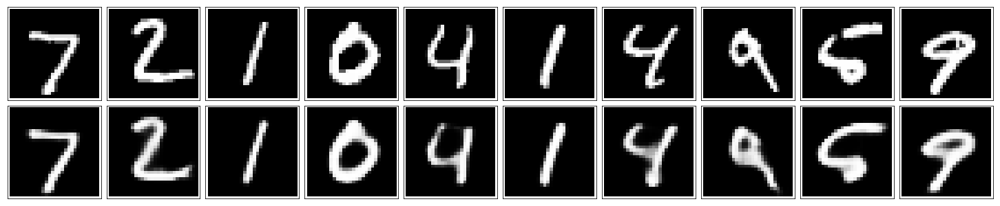

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
reconstructed = sess.run(decoded, feed_dict={inputs_: in_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([in_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)


fig.tight_layout(pad=0.1)

In [19]:
sess.close()

## Denoising

As I've mentioned before, autoencoders like the ones you've built so far aren't too useful in practive. However, they can be used to denoise images quite successfully just by training the network on noisy images. We can create the noisy images ourselves by adding Gaussian noise to the training images, then clipping the values to be between 0 and 1. We'll use noisy images as input and the original, clean images as targets. Here's an example of the noisy images I generated and the denoised images.

![Denoising autoencoder](assets/denoising.png)


Since this is a harder problem for the network, we'll want to use deeper convolutional layers here, more feature maps. I suggest something like 32-32-16 for the depths of the convolutional layers in the encoder, and the same depths going backward through the decoder. Otherwise the architecture is the same as before.

> **Exercise:** Build the network for the denoising autoencoder. It's the same as before, but with deeper layers. I suggest 32-32-16 for the depths, but you can play with these numbers, or add more layers.

In [21]:
inputs_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='inputs')
targets_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='targets')

### Encoder
conv1 = tf.layers.conv2d(inputs_, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32
maxpool1 = tf.layers.max_pooling2d(conv1, (2,2), (2,2), padding='same')
# Now 14x14x32
conv2 = tf.layers.conv2d(maxpool1, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
# Now 7x7x32
conv3 = tf.layers.conv2d(maxpool2, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
# Now 4x4x16

### Decoder
upsample1 = tf.image.resize_nearest_neighbor(encoded, (7,7))
# Now 7x7x16
conv4 = tf.layers.conv2d(upsample1, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
# Now 14x14x16
conv5 = tf.layers.conv2d(upsample2, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
# Now 28x28x32
conv6 = tf.layers.conv2d(upsample3, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32

logits = tf.layers.conv2d(conv6, 1, (3,3), padding='same', activation=None)
#Now 28x28x1

decoded = tf.nn.sigmoid(logits, name='decoded')

loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_, logits=logits)
cost = tf.reduce_mean(loss)
opt = tf.train.AdamOptimizer(0.001).minimize(cost)

In [22]:
sess = tf.Session()

In [ ]:
epochs = 100
batch_size = 200
# Set's how much noise we're adding to the MNIST images
noise_factor = 0.5
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        # Get images from the batch
        imgs = batch[0].reshape((-1, 28, 28, 1))
        
        # Add random noise to the input images
        noisy_imgs = imgs + noise_factor * np.random.randn(*imgs.shape)
        # Clip the images to be between 0 and 1
        noisy_imgs = np.clip(noisy_imgs, 0., 1.)
        
        # Noisy images as inputs, original images as targets
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: noisy_imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

## Checking out the performance

Here I'm adding noise to the test images and passing them through the autoencoder. It does a suprising great job of removing the noise, even though it's sometimes difficult to tell what the original number is.

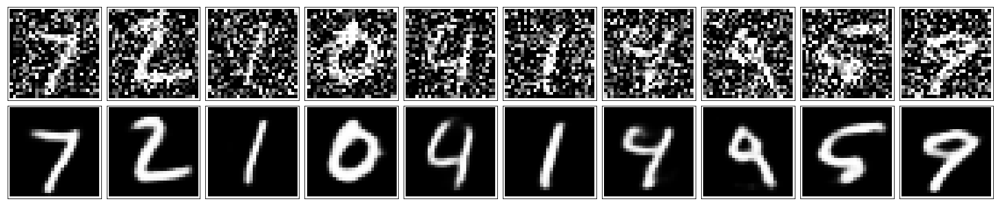

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
noisy_imgs = in_imgs + noise_factor * np.random.randn(*in_imgs.shape)
noisy_imgs = np.clip(noisy_imgs, 0., 1.)

reconstructed = sess.run(decoded, feed_dict={inputs_: noisy_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([noisy_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

fig.tight_layout(pad=0.1)